In [85]:
# Import libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # Adjust the configuration of the plot we will create

pd.options.mode.chained_assignment = None

# Read in the data

df = pd.read_csv(r'C:\Users\User\Desktop\Python Project\movies.csv')

In [86]:
# Now let's take a look at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [87]:
# Let's check if there is any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [88]:
# Replace missing values

df["rating"].fillna("Not Rated", inplace = True)
df["gross"].fillna(0, inplace = True)
df["budget"].fillna(0, inplace = True)

In [89]:
# Data types for our column

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [90]:
# Change data type of columns

df["budget"] = df["budget"].astype("int64")
df["gross"] = df["gross"].astype("int64")

In [91]:
# Extract date from column 'released'

def parse_date(date_string):
    date_string = str(date_string)
    bracket_start = date_string.find('(')
    date = date_string[:bracket_start-1]
    return date

## parse_date = lambda date_string: date_string[str(date_string).find('(')-1]

df['released'] = df['released'].apply(parse_date)

# Convert string to datetime

df['released'] = pd.to_datetime(df['released'], errors = 'coerce', format = '%B %d, %Y')

In [92]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,1980-06-13,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,1980-07-02,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,1980-06-20,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,1980-07-02,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,1980-07-25,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,Not Rated,Drama,2020,2020-10-23,3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,0,NaN,90.0
7664,Dream Round,Not Rated,Comedy,2020,2020-02-07,4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,0,0,Cactus Blue Entertainment,90.0
7665,Saving Mbango,Not Rated,Drama,2020,2020-04-27,5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,0,Embi Productions,NaN
7666,It's Just Us,Not Rated,Drama,2020,2020-10-01,NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000,0,NaN,120.0


In [95]:
# Create correct year column

df['coreect_year'] = df['released'].astype(str).str[:4]

df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,coreect_year
0,The Shining,R,Drama,1980,1980-06-13,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,1980-07-02,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,1980-06-20,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,1980-07-02,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,1980-07-25,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,Not Rated,Drama,2020,2020-10-23,3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,0,NaN,90.0,2020
7664,Dream Round,Not Rated,Comedy,2020,2020-02-07,4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,0,0,Cactus Blue Entertainment,90.0,2020
7665,Saving Mbango,Not Rated,Drama,2020,2020-04-27,5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,0,Embi Productions,NaN,2020
7666,It's Just Us,Not Rated,Drama,2020,2020-10-01,NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000,0,NaN,120.0,2020


In [128]:
# Sorting data 

df = df.sort_values(by=['gross'], inplace=False, ascending=False)

In [101]:
# Showing all rows

pd.set_option('display.max_rows', None)

In [106]:
# Drop any duplicates

## df['company'].drop_duplicates().sort_values(ascending=False)
## df.drop_duplicates()  --for entire dataframe

df['name'] = df['name'].drop_duplicates()

In [107]:
# My guesses:
# Budget has high correlation with gross
# Company has high correlation with budget

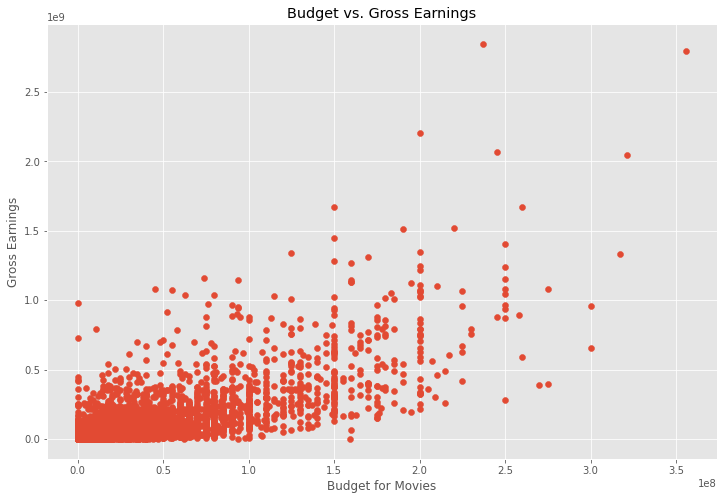

In [115]:
# Scatter plot with 'budget' vs. 'gross'

plt.scatter(x = df['budget'], y = df['gross'])

plt.title('Budget vs. Gross Earnings')

plt.xlabel('Budget for Movies')

plt.ylabel('Gross Earnings')

plt.show()


In [113]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,coreect_year
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


<AxesSubplot:xlabel='budget', ylabel='gross'>

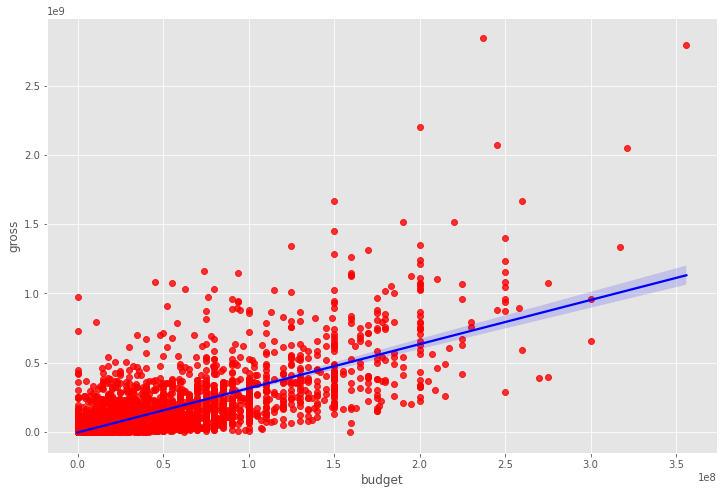

In [117]:
# Plot 'budget' vs. 'gross' using seaborn

sns.regplot(x = 'budget', y = 'gross', data = df, scatter_kws={"color": "red"}, line_kws={"color": "blue"})

In [122]:
# Let's start looking at correlation

df.corr(method = 'pearson')  #pearson, kendall, spearman

,year,score,votes,budget,gross,runtime
year,1.000000,0.097995,0.222945,0.309212,0.261900,0.120811
score,0.097995,1.000000,0.409182,0.055665,0.186392,0.399451
votes,0.222945,0.409182,1.000000,0.486862,0.632834,0.309212
budget,0.309212,0.055665,0.486862,1.000000,0.750157,0.269510
gross,0.261900,0.186392,0.632834,0.750157,1.000000,0.245235
runtime,0.120811,0.399451,0.309212,0.269510,0.245235,1.000000


In [123]:
# High correlation between budget and gross
# I was right

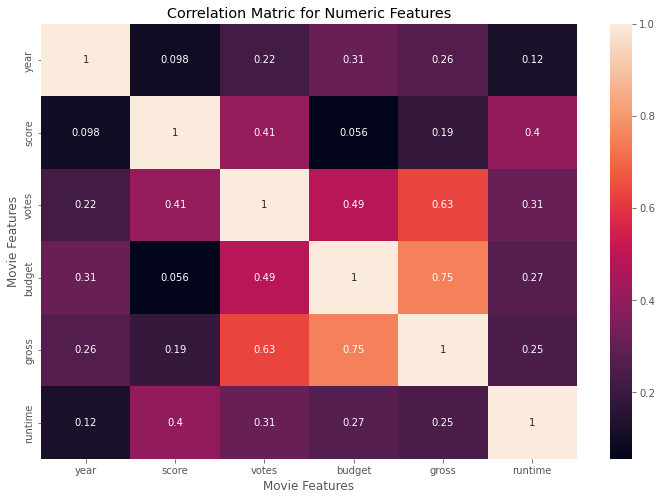

In [125]:
# Visualization of correlation matrix

correlation_matrix = df.corr(method = 'pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matric for Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')


plt.show()

In [126]:
# Looks at Company

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,coreect_year
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


In [127]:
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,coreect_year
5445,533,5,0,2009,2009-12-18,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,29
7445,535,5,0,2019,2019-04-26,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,39
3045,6896,5,6,1997,1997-12-19,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,17
6663,5144,5,0,2015,2015-12-18,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,35
7244,536,5,0,2018,2018-04-27,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,38
7480,-1,4,2,2019,2019-07-19,6.9,222000.0,1455,1919,676,55,260000000,1670727580,2316,118.0,39
6653,2969,5,0,2015,2015-06-12,7.0,593000.0,517,3568,437,55,150000000,1670516444,2281,124.0,35
6043,-1,5,0,2012,2012-05-04,8.0,1300000.0,1517,2314,2241,55,220000000,1518815515,1606,143.0,32
6646,2145,5,0,2015,2015-04-03,7.1,370000.0,1189,706,2721,55,190000000,1515341399,2281,137.0,35
7494,2131,4,2,2019,2019-11-22,6.8,148000.0,432,1950,1527,55,150000000,1450026933,2315,103.0,39


In [129]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,coreect_year
5445,533,5,0,2009,2009-12-18,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,29
7445,535,5,0,2019,2019-04-26,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,39
3045,6896,5,6,1997,1997-12-19,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,17
6663,5144,5,0,2015,2015-12-18,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,35
7244,536,5,0,2018,2018-04-27,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,38
7480,-1,4,2,2019,2019-07-19,6.9,222000.0,1455,1919,676,55,260000000,1670727580,2316,118.0,39
6653,2969,5,0,2015,2015-06-12,7.0,593000.0,517,3568,437,55,150000000,1670516444,2281,124.0,35
6043,-1,5,0,2012,2012-05-04,8.0,1300000.0,1517,2314,2241,55,220000000,1518815515,1606,143.0,32
6646,2145,5,0,2015,2015-04-03,7.1,370000.0,1189,706,2721,55,190000000,1515341399,2281,137.0,35
7494,2131,4,2,2019,2019-11-22,6.8,148000.0,432,1950,1527,55,150000000,1450026933,2315,103.0,39


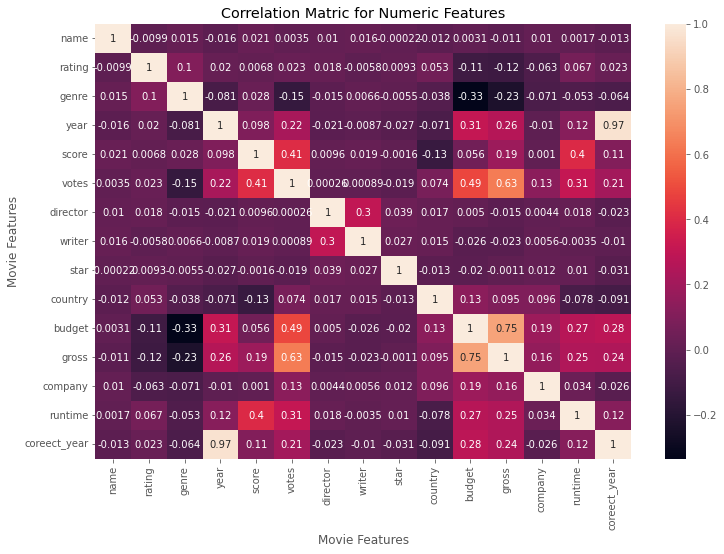

In [130]:
# Visualization of correlation matrix

correlation_matrix = df_numerized.corr(method = 'pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matric for Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')


plt.show()

In [131]:
df_numerized.corr()

,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company,runtime,coreect_year
name,1.000000,-0.009926,0.015473,-0.016020,0.021181,0.003550,0.010271,0.015552,-0.000218,-0.011763,0.003078,-0.011237,0.010105,0.001658,-0.013443
rating,-0.009926,1.000000,0.104108,0.019913,0.006828,0.022824,0.018466,-0.005808,0.009278,0.053417,-0.112982,-0.119094,-0.062582,0.067197,0.022785
genre,0.015473,0.104108,1.000000,-0.081261,0.027965,-0.145307,-0.015258,0.006567,-0.005477,-0.037615,-0.334021,-0.234297,-0.071067,-0.052711,-0.063573
year,-0.016020,0.019913,-0.081261,1.000000,0.097995,0.222945,-0.020795,-0.008656,-0.027242,-0.070938,0.309212,0.261900,-0.010431,0.120811,0.967486
score,0.021181,0.006828,0.027965,0.097995,1.000000,0.409182,0.009559,0.019416,-0.001609,-0.133348,0.055665,0.186392,0.001030,0.399451,0.107219
votes,0.003550,0.022824,-0.145307,0.222945,0.409182,1.000000,0.000260,0.000892,-0.019282,0.073625,0.486862,0.632834,0.133204,0.309212,0.206475
director,0.010271,0.018466,-0.015258,-0.020795,0.009559,0.000260,1.000000,0.299067,0.039234,0.017490,0.004976,-0.014916,0.004404,0.017624,-0.022579
writer,0.015552,-0.005808,0.006567,-0.008656,0.019416,0.000892,0.299067,1.000000,0.027245,0.015343,-0.025911,-0.022997,0.005646,-0.003511,-0.010063
star,-0.000218,0.009278,-0.005477,-0.027242,-0.001609,-0.019282,0.039234,0.027245,1.000000,-0.012998,-0.019952,-0.001129,0.012442,0.010174,-0.031166
country,-0.011763,0.053417,-0.037615,-0.070938,-0.133348,0.073625,0.017490,0.015343,-0.012998,1.000000,0.131720,0.095325,0.095548,-0.078412,-0.090962


In [132]:
corr_mat = df_numerized.corr()

corr_pairs = corr_mat.unstack()

corr_pairs

name          name            1.000000
              rating         -0.009926
              genre           0.015473
              year           -0.016020
              score           0.021181
              votes           0.003550
              director        0.010271
              writer          0.015552
              star           -0.000218
              country        -0.011763
              budget          0.003078
              gross          -0.011237
              company         0.010105
              runtime         0.001658
              coreect_year   -0.013443
rating        name           -0.009926
              rating          1.000000
              genre           0.104108
              year            0.019913
              score           0.006828
              votes           0.022824
              director        0.018466
              writer         -0.005808
              star            0.009278
              country         0.053417
              budget     

In [134]:
sorted_pairs = corr_pairs.sort_values(ascending=False)

sorted_pairs

name          name            1.000000
rating        rating          1.000000
runtime       runtime         1.000000
company       company         1.000000
gross         gross           1.000000
budget        budget          1.000000
country       country         1.000000
star          star            1.000000
director      director        1.000000
votes         votes           1.000000
score         score           1.000000
year          year            1.000000
genre         genre           1.000000
writer        writer          1.000000
coreect_year  coreect_year    1.000000
year          coreect_year    0.967486
coreect_year  year            0.967486
budget        gross           0.750157
gross         budget          0.750157
              votes           0.632834
votes         gross           0.632834
budget        votes           0.486862
votes         budget          0.486862
score         votes           0.409182
votes         score           0.409182
runtime       score      

In [135]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

name          name            1.000000
rating        rating          1.000000
runtime       runtime         1.000000
company       company         1.000000
gross         gross           1.000000
budget        budget          1.000000
country       country         1.000000
star          star            1.000000
director      director        1.000000
votes         votes           1.000000
score         score           1.000000
year          year            1.000000
genre         genre           1.000000
writer        writer          1.000000
coreect_year  coreect_year    1.000000
year          coreect_year    0.967486
coreect_year  year            0.967486
budget        gross           0.750157
gross         budget          0.750157
              votes           0.632834
votes         gross           0.632834
dtype: float64

In [ ]:
# 'votes' and 'budget' have the highest correlation to gross earnings

# Company has low correlation (I was wrong).